In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from geopy.distance import geodesic
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

In [2]:
data=pd.read_csv('AB_NYC_2019.csv')
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19/10/2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21/05/2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05/07/2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19/11/2018,0.10,1,0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [4]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [5]:
data.describe(include='object')

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
count,48879,48874,48895,48895,48895,38843
unique,47896,11452,5,221,3,1764
top,Hillside Hotel,Michael,Manhattan,Williamsburg,Entire home/apt,23/06/2019
freq,18,417,21661,3920,25409,1413


In [6]:
missing_data = pd.DataFrame({
        'Column': data.columns,
        'Missing_Count': data.isnull().sum(),
        'Missing_Percentage': (data.isnull().sum() / len(data)) * 100
    })
missing_data = missing_data[missing_data['Missing_Count'] > 0].sort_values('Missing_Percentage', ascending=False)
print(missing_data)

                              Column  Missing_Count  Missing_Percentage
last_review              last_review          10052           20.558339
reviews_per_month  reviews_per_month          10052           20.558339
host_name                  host_name             21            0.042949
name                            name             16            0.032723


In [7]:
#Dealing with null values 
data = data.drop(['host_name', 'name'], axis=1)


In [8]:
data.columns

Index(['id', 'host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

In [9]:
data.loc[data['number_of_reviews'] == 0, 'reviews_per_month'] = 0

In [10]:
data.isnull().sum()

id                                    0
host_id                               0
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                     0
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [11]:
data['last_review'] = pd.to_datetime(data['last_review'],dayfirst=True)
median_date = data['last_review'].median()
data['last_review'].fillna(median_date, inplace=True)

In [12]:
data.isnull().sum()

id                                0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [13]:
#Check duplicates
duplicates_count = data.duplicated().sum()
print(f"Number of duplicate rows: {duplicates_count}")


Number of duplicate rows: 0


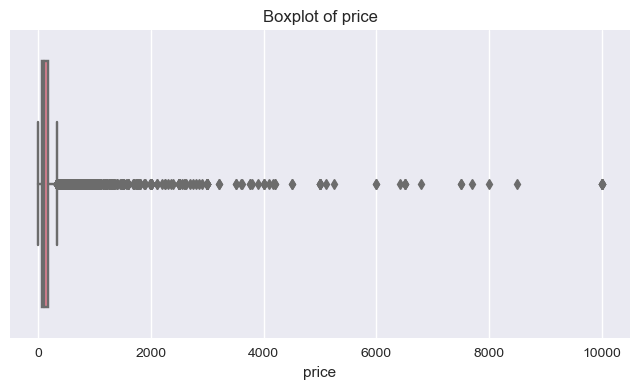

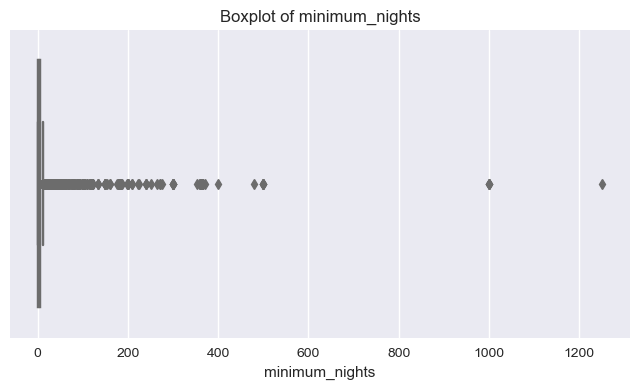

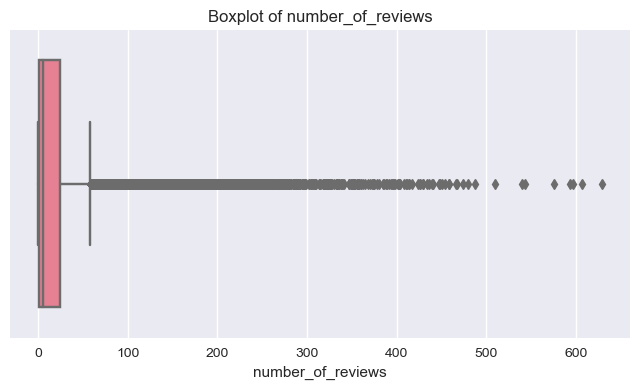

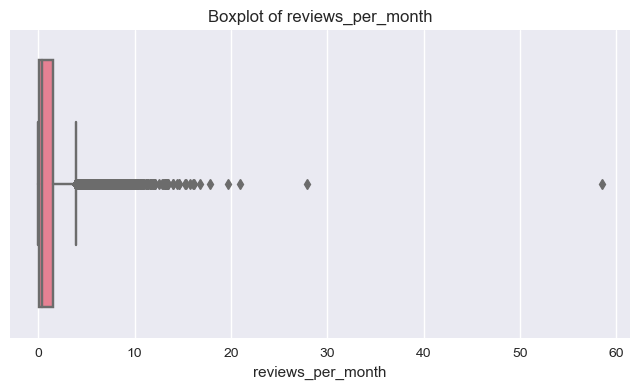

In [14]:
#CHECK OUTLIERS
cols = ["price", "minimum_nights", "number_of_reviews", "reviews_per_month"]
for col in cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=data[col])
    plt.title(f"Boxplot of {col}")
    plt.show()

In [15]:
#dealing with outliers
q1 = data['price'].quantile(0.25)
q3 = data['price'].quantile(0.75)
iqr = q3 - q1
upper_limit = q3 + 3 * iqr
data = data[data['price'] <= upper_limit]
data = data[(data['minimum_nights'] > 0) & (data['minimum_nights'] <= 365)]
upper_reviews = data['number_of_reviews'].quantile(0.99)
data = data[data['number_of_reviews'] <= upper_reviews]
upper_rpm = data['reviews_per_month'].quantile(0.99)
data = data[data['reviews_per_month'] <= upper_rpm]

print(" Data shape after handling outliers:", data.shape)

 Data shape after handling outliers: (46609, 14)


In [16]:
#Featuear engineering
reference_date = data['last_review'].max() if data['last_review'].max() else datetime.now()
data['days_since_last_review'] = (reference_date - data['last_review']).dt.days

def categorize_activity_status(days_since):
    if pd.isna(days_since):
        return 'No Reviews'
    elif days_since <= 30:
        return 'Very Active'  
    elif days_since <= 90:
        return 'Active'       
    elif days_since <= 180:
        return 'Moderately Active'  
    elif days_since <= 365:
        return 'Less Active'  
    else:
        return 'Inactive'     
    
data['activity_status'] = data['days_since_last_review'].apply(categorize_activity_status)

In [17]:
data['last_review_month'] = data['last_review'].dt.month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'
    
data['last_review_season'] = data['last_review_month'].apply(get_season)

In [18]:
def categorize_host_type(count):
    if count == 1:
        return 'Single Listing Host'
    elif count <= 3:
        return 'Small Scale Host'
    elif count <= 10:
        return 'Medium Scale Host'
    elif count <= 25:
        return 'Large Scale Host'
    else:
        return 'Commercial Host'
    
data['host_type'] = data['calculated_host_listings_count'].apply(categorize_host_type)

In [19]:
CITY_CENTER_LAT = 40.7128
CITY_CENTER_LON = -74.0060
def calculate_distance_from_center(lat, lon):
    
    try:
        property_coords = (lat, lon)
        city_center_coords = (CITY_CENTER_LAT, CITY_CENTER_LON)
        distance = geodesic(property_coords, city_center_coords).kilometers
        return round(distance, 2)
    except:
        return np.nan
data['distance'] = data.apply(lambda row: calculate_distance_from_center(
    row['latitude'], row['longitude']), axis=1)

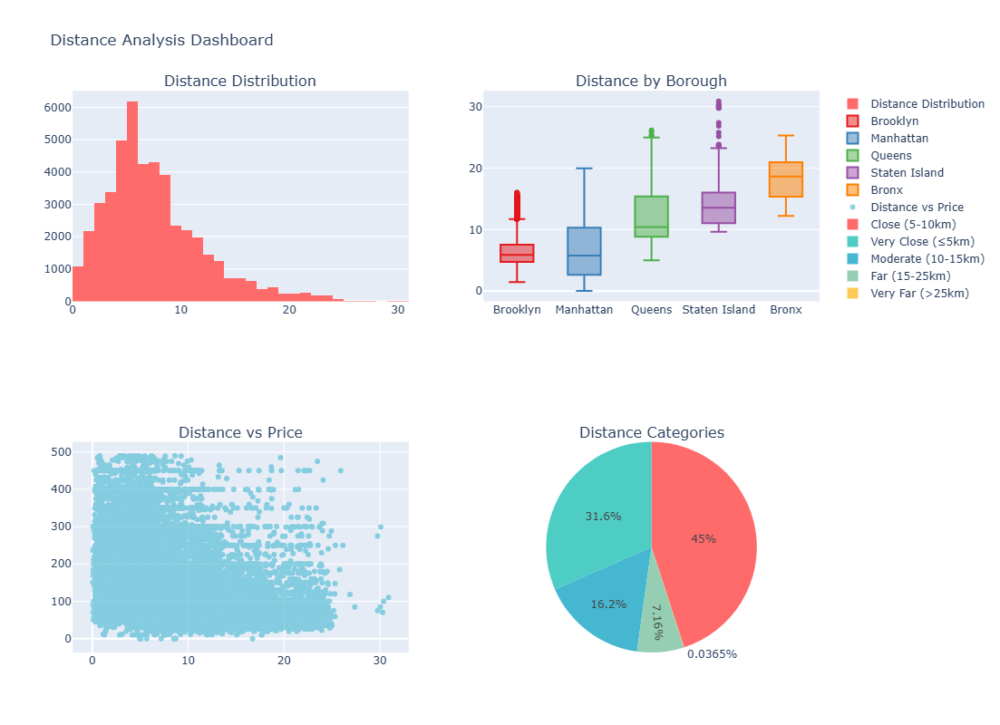

Distance Categories Distribution:
  Close (5-10km): 20,973 (45.0%)
  Very Close (≤5km): 14,714 (31.6%)
  Moderate (10-15km): 7,566 (16.2%)
  Far (15-25km): 3,339 (7.2%)
  Very Far (>25km): 17 (0.0%)


In [20]:
fig_dist = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Distance Distribution', 'Distance by Borough',
                   'Distance vs Price', 'Distance Categories'),
    specs=[[{"secondary_y": False}, {"secondary_y": False}],
           [{"secondary_y": False}, {"type": "pie"}]]
)

# Distance histogram
fig_dist.add_trace(
    go.Histogram(x=data['distance'], nbinsx=50, marker_color='#FF6B6B', 
                name='Distance Distribution'),
    row=1, col=1
)

# Distance by borough box plot
for i, borough in enumerate(data['neighbourhood_group'].unique()):
    borough_data = data[data['neighbourhood_group'] == borough]
    fig_dist.add_trace(
        go.Box(y=borough_data['distance'], name=borough,
               marker_color=px.colors.qualitative.Set1[i]),
        row=1, col=2
    )

# Distance vs Price scatter
fig_dist.add_trace(
    go.Scatter(x=data['distance'], y=data['price'], 
              mode='markers', opacity=0.6, marker_color='#45B7D1',
              name='Distance vs Price'),
    row=2, col=1
)

# Create distance categories for pie chart
def categorize_distance(distance):
    if pd.isna(distance):
        return 'Unknown'
    elif distance <= 5:
        return 'Very Close (≤5km)'
    elif distance <= 10:
        return 'Close (5-10km)'
    elif distance <= 15:
        return 'Moderate (10-15km)'
    elif distance <= 25:
        return 'Far (15-25km)'
    else:
        return 'Very Far (>25km)'

data['distance_category'] = data['distance'].apply(categorize_distance)
distance_cats = data['distance_category'].value_counts()

fig_dist.add_trace(
    go.Pie(labels=distance_cats.index, values=distance_cats.values,
           marker_colors=['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FECA57']),
    row=2, col=2
)

fig_dist.update_layout(height=800, title_text="Distance Analysis Dashboard")
fig_dist.show()

print("Distance Categories Distribution:")
for cat, count in distance_cats.items():
    print(f"  {cat}: {count:,} ({count/len(data)*100:.1f}%)")


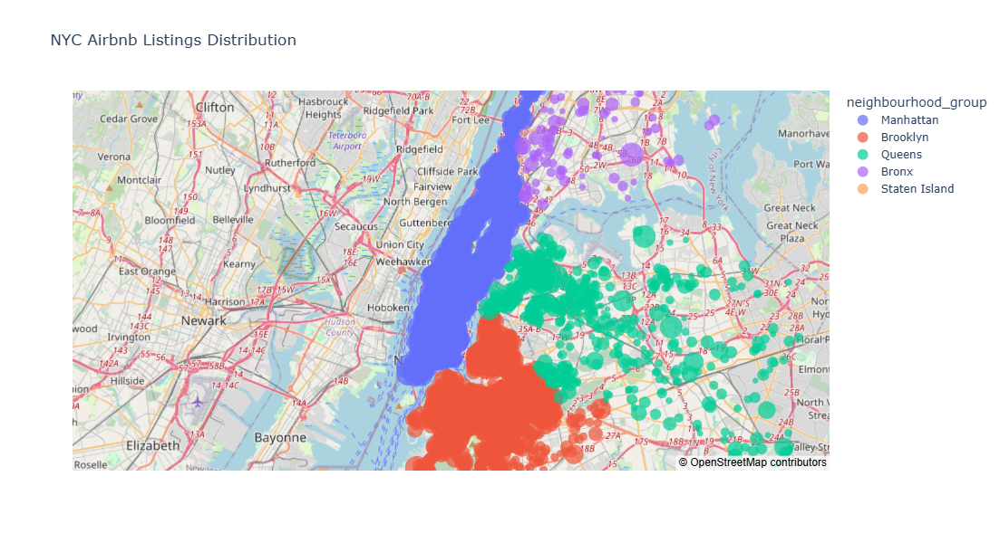

In [21]:
fig_map = px.scatter_mapbox(
    data.sample(5000) if len(data) > 5000 else data,  
    lat="latitude", 
    lon="longitude",
    color="neighbourhood_group",
    size="price",
    hover_data=["neighbourhood", "room_type", "price"],
    mapbox_style="open-street-map",
    title="NYC Airbnb Listings Distribution",
    height=600
)
fig_map.update_layout(mapbox=dict(center=dict(lat=40.7589, lon=-73.9851), zoom=10))
fig_map.show()

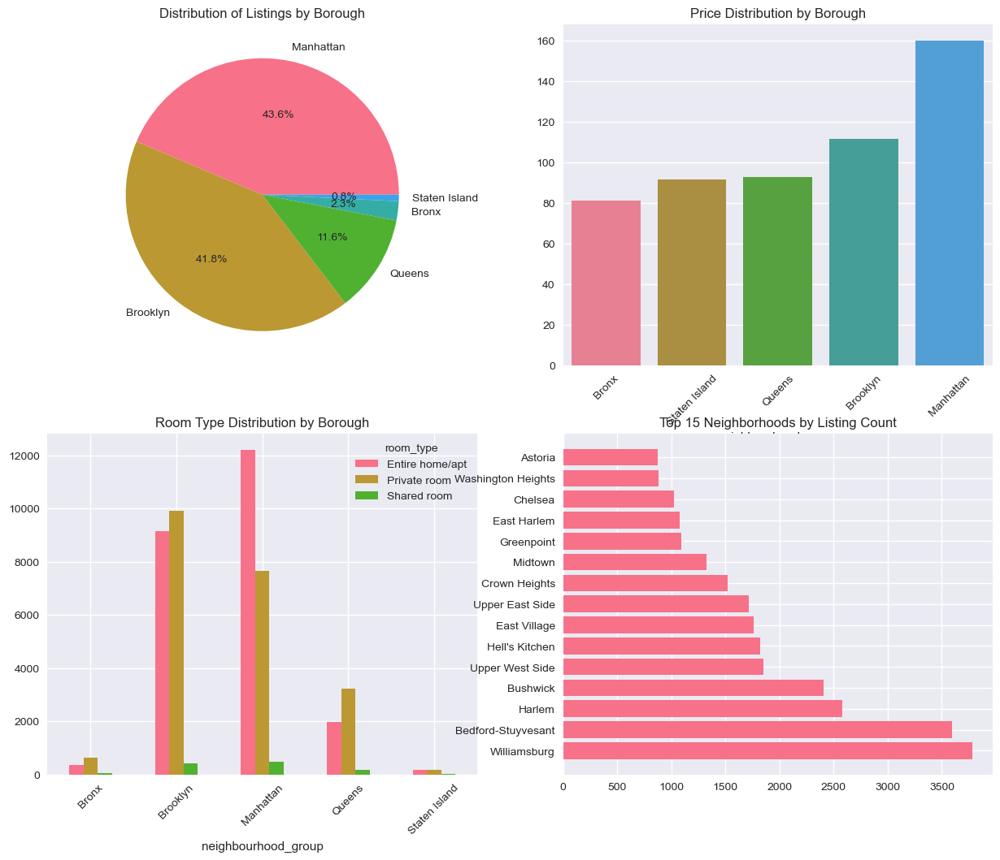

<Figure size 800x500 with 0 Axes>

In [22]:
# Borough analysis
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Listings by borough
borough_counts = data['neighbourhood_group'].value_counts()
axes[0,0].pie(borough_counts.values, labels=borough_counts.index, autopct='%1.1f%%')
axes[0,0].set_title('Distribution of Listings by Borough')

# Average price by borough
neigh_stats = data.groupby('neighbourhood_group')['price'].mean().sort_values()
plt.figure(figsize=(8,5))
sns.barplot(x=neigh_stats.index, y=neigh_stats.values, ax=axes[0,1])

axes[0,1].set_title('Price Distribution by Borough')
axes[0,1].tick_params(axis='x', rotation=45)

# Room type distribution by borough
pd.crosstab(data['neighbourhood_group'], data['room_type']).plot(kind='bar', ax=axes[1,0])
axes[1,0].set_title('Room Type Distribution by Borough')
axes[1,0].tick_params(axis='x', rotation=45)

# Top neighborhoods by listings count
top_neighborhoods = data['neighbourhood'].value_counts().head(15)
axes[1,1].barh(range(len(top_neighborhoods)), top_neighborhoods.values)
axes[1,1].set_yticks(range(len(top_neighborhoods)))
axes[1,1].set_yticklabels(top_neighborhoods.index)
axes[1,1].set_title('Top 15 Neighborhoods by Listing Count')

plt.tight_layout()
plt.show()

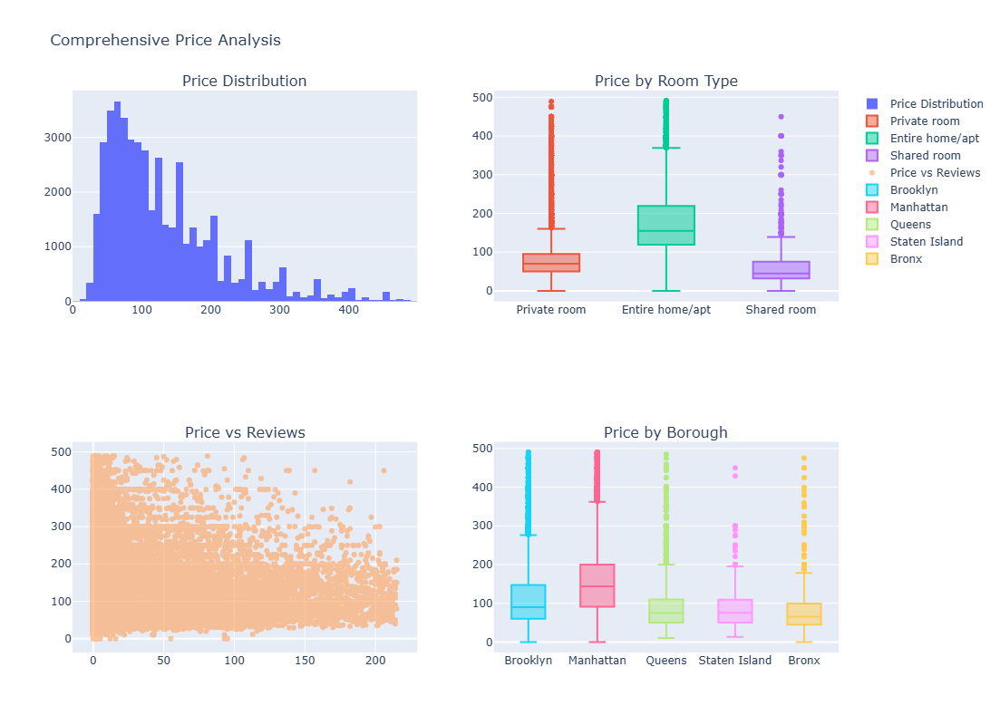


Price Statistics by Room Type:
                   mean  median    std  min  max
room_type                                       
Entire home/apt  176.87   155.0  82.98    0  490
Private room      81.19    70.0  48.60    0  489
Shared room       62.46    45.0  53.36    0  450

Price Statistics by Borough:
                       mean  median    std
neighbourhood_group                       
Bronx                 81.24    65.0  58.45
Brooklyn             111.46    90.0  72.66
Manhattan            160.23   144.0  89.52
Queens                92.74    75.0  62.55
Staten Island         91.71    75.0  63.66


In [23]:
# Interactive price distribution
fig_price = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Price Distribution', 'Price by Room Type', 
                   'Price vs Reviews', 'Price by Borough'),
    specs=[[{"secondary_y": False}, {"secondary_y": False}],
           [{"secondary_y": False}, {"secondary_y": False}]]
)

# Price histogram
fig_price.add_trace(
    go.Histogram(x=data['price'], nbinsx=50, name='Price Distribution'),
    row=1, col=1
)

# Price by room type
for room_type in data['room_type'].unique():
    room_data = data[data['room_type'] == room_type]
    fig_price.add_trace(
        go.Box(y=room_data['price'], name=room_type),
        row=1, col=2
    )

# Price vs Reviews scatter
fig_price.add_trace(
    go.Scatter(
        x=data['number_of_reviews'], 
        y=data['price'],
        mode='markers',
        opacity=0.6,
        name='Price vs Reviews'
    ),
    row=2, col=1
)

# Price by borough
for borough in data['neighbourhood_group'].unique():
    borough_data = data[data['neighbourhood_group'] == borough]
    fig_price.add_trace(
        go.Box(y=borough_data['price'], name=borough),
        row=2, col=2
    )

fig_price.update_layout(height=800, title_text="Comprehensive Price Analysis")
fig_price.show()

# Price statistics by room type and borough
print("\nPrice Statistics by Room Type:")
price_by_room = data.groupby('room_type')['price'].agg(['mean', 'median', 'std', 'min', 'max']).round(2)
print(price_by_room)

print("\nPrice Statistics by Borough:")
price_by_borough = data.groupby('neighbourhood_group')['price'].agg(['mean', 'median', 'std']).round(2)
print(price_by_borough)


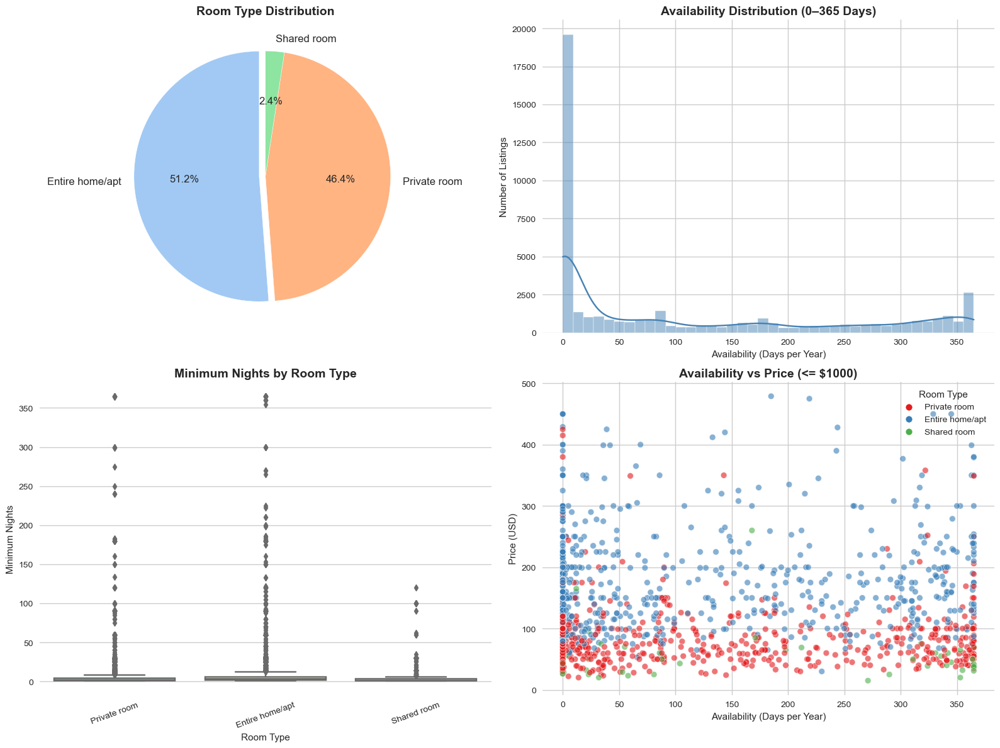

In [24]:

sns.set_style("whitegrid")
sns.set_palette("Set2")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

#  Room type distribution (Pie)
room_counts = data['room_type'].value_counts()
colors = sns.color_palette("pastel")[0:len(room_counts)]
axes[0,0].pie(
    room_counts.values, 
    labels=room_counts.index, 
    autopct='%1.1f%%',
    startangle=90,
    explode=[0.05 if i==0 else 0 for i in range(len(room_counts))],
    colors=colors,
    textprops={'fontsize': 12}
)
axes[0,0].set_title('Room Type Distribution', fontsize=14, fontweight='bold')

# Availability analysis (Histogram)
sns.histplot(
    data=data[data['availability_365'] <= 365], 
    x='availability_365', 
    bins=40, 
    kde=True,
    color="steelblue", 
    ax=axes[0,1]
)
axes[0,1].set_title('Availability Distribution (0–365 Days)', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel("Availability (Days per Year)")
axes[0,1].set_ylabel("Number of Listings")

#  Minimum nights by room type (Boxplot)
filtered_min_nights = data[data['minimum_nights'] <= 365]
sns.boxplot(
    data=filtered_min_nights, 
    x='room_type', 
    y='minimum_nights',
    palette="Set3", 
    ax=axes[1,0]
)
axes[1,0].set_title('Minimum Nights by Room Type', fontsize=14, fontweight='bold')
axes[1,0].set_xlabel("Room Type")
axes[1,0].set_ylabel("Minimum Nights")
axes[1,0].tick_params(axis='x', rotation=20)

# Availability vs Price (Scatter)
filtered_price = data[(data['price'] <= 1000) & (data['availability_365'] <= 365)]
sns.scatterplot(
    data=filtered_price.sample(min(1500, len(filtered_price))),
    x='availability_365', 
    y='price', 
    hue='room_type',
    palette="Set1", 
    alpha=0.6, 
    ax=axes[1,1]
)
axes[1,1].set_title('Availability vs Price (<= $1000)', fontsize=14, fontweight='bold')
axes[1,1].set_xlabel("Availability (Days per Year)")
axes[1,1].set_ylabel("Price (USD)")
axes[1,1].legend(title="Room Type", fontsize=10, title_fontsize=11)

plt.tight_layout()
plt.show()



1. HOST TYPE DISTRIBUTION
----------------------------------------


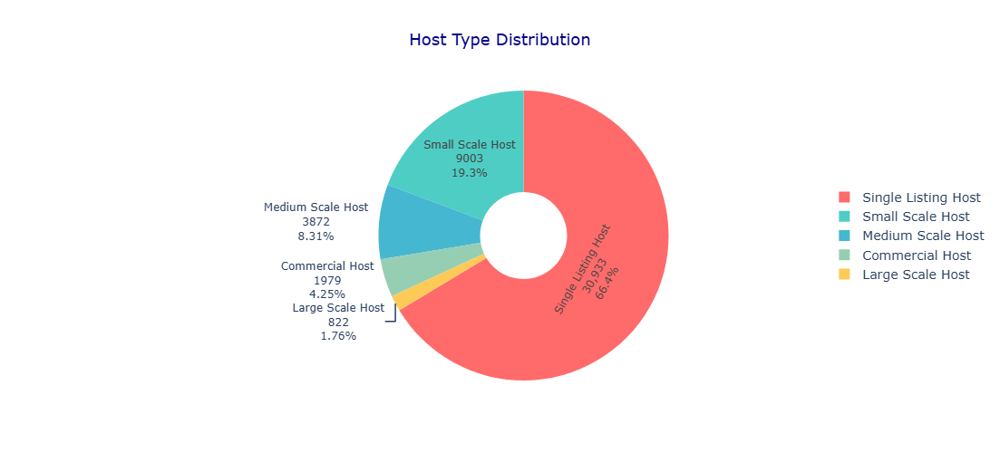

Host Type Counts:
  Single Listing Host: 30,933 (66.4%)
  Small Scale Host: 9,003 (19.3%)
  Medium Scale Host: 3,872 (8.3%)
  Commercial Host: 1,979 (4.2%)
  Large Scale Host: 822 (1.8%)


In [25]:
#  HOST ANALYSIS
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FECA57', '#FF9FF3']
#  HOST TYPE DISTRIBUTION 
print("\n1. HOST TYPE DISTRIBUTION")
print("-" * 40)
host_type_counts = data['host_type'].value_counts()
fig_pie = go.Figure(data=[go.Pie(
    labels=host_type_counts.index, 
    values=host_type_counts.values,
    marker_colors=colors[:len(host_type_counts)],
    textinfo='label+percent+value',
    textposition='auto',
    textfont_size=12,
    hole=0.3,  # Donut chart for better readability
    hovertemplate='<b>%{label}</b><br>' +
                  'Count: %{value:,}<br>' +
                  'Percentage: %{percent}<br>' +
                  '<extra></extra>'
)])

fig_pie.update_layout(
    title={
        'text': "Host Type Distribution",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    font=dict(size=14),
    height=500,
    showlegend=True,
    legend=dict(orientation="v", yanchor="middle", y=0.5, xanchor="left", x=1.05)
)
fig_pie.show()

print("Host Type Counts:")
for host_type, count in host_type_counts.items():
    print(f"  {host_type}: {count:,} ({count/len(data)*100:.1f}%)")


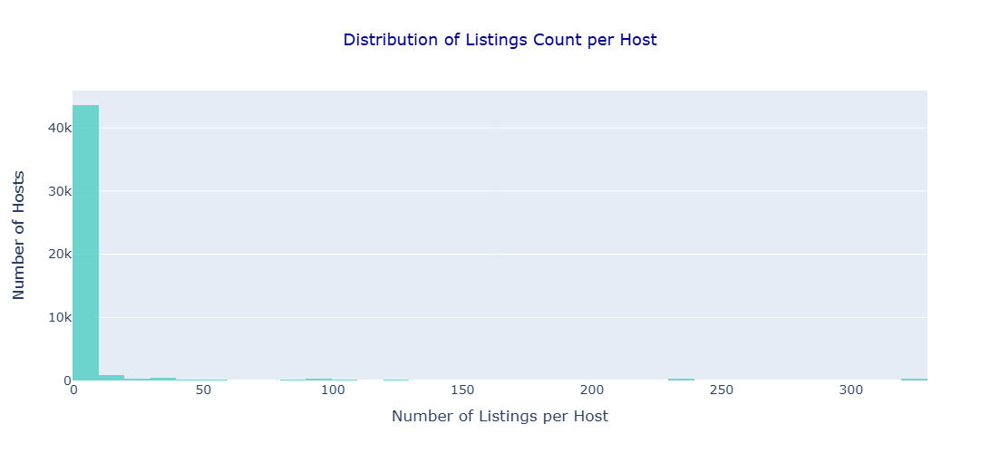

Listings per Host Statistics:
  Mean: 7.19
  Median: 1.00
  Max: 327
  Hosts with 1 listing: 30,933
  Hosts with >10 listings: 2,801


In [26]:
# HOST LISTINGS COUNT DISTRIBUTION

fig_hist = go.Figure(data=[go.Histogram(
    x=data['calculated_host_listings_count'],
    nbinsx=50,
    marker_color='#4ECDC4',
    opacity=0.8,
    name='Listings Distribution',
    hovertemplate='Listings Range: %{x}<br>Host Count: %{y}<extra></extra>'
)])

fig_hist.update_layout(
    title={
        'text': "Distribution of Listings Count per Host",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    xaxis_title="Number of Listings per Host",
    yaxis_title="Number of Hosts",
    font=dict(size=14),
    height=500,
    showlegend=False
)
fig_hist.show()

print(f"Listings per Host Statistics:")
print(f"  Mean: {data['calculated_host_listings_count'].mean():.2f}")
print(f"  Median: {data['calculated_host_listings_count'].median():.2f}")
print(f"  Max: {data['calculated_host_listings_count'].max()}")
print(f"  Hosts with 1 listing: {(data['calculated_host_listings_count'] == 1).sum():,}")
print(f"  Hosts with >10 listings: {(data['calculated_host_listings_count'] > 10).sum():,}")

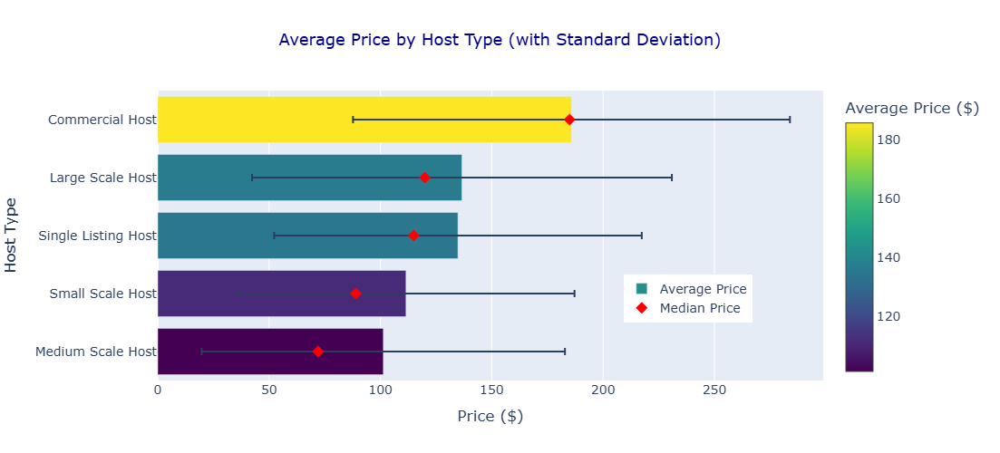

Price Statistics by Host Type:
  Medium Scale Host:
    Mean: $101.30
    Median: $72.00
    Std Dev: $81.59
  Small Scale Host:
    Mean: $111.49
    Median: $89.00
    Std Dev: $75.69
  Single Listing Host:
    Mean: $134.83
    Median: $115.00
    Std Dev: $82.55
  Large Scale Host:
    Mean: $136.63
    Median: $120.00
    Std Dev: $94.28
  Commercial Host:
    Mean: $185.81
    Median: $185.00
    Std Dev: $98.12


In [27]:
#  AVERAGE PRICE BY HOST TYPE

host_price_stats = data.groupby('host_type')['price'].agg(['mean', 'std', 'median']).sort_values('mean')

fig_bar = go.Figure()

# Add bars with error bars
fig_bar.add_trace(go.Bar(
    y=host_price_stats.index,
    x=host_price_stats['mean'],
    orientation='h',
    marker=dict(
        color=host_price_stats['mean'],
        colorscale='Viridis',
        colorbar=dict(title="Average Price ($)")
    ),
    error_x=dict(type='data', array=host_price_stats['std']),
    name='Average Price',
    hovertemplate='<b>%{y}</b><br>' +
                  'Average Price: $%{x:.2f}<br>' +
                  'Standard Deviation: $%{error_x.array:.2f}<br>' +
                  '<extra></extra>'
))

fig_bar.add_trace(go.Scatter(
    y=host_price_stats.index,
    x=host_price_stats['median'],
    mode='markers',
    marker=dict(symbol='diamond', size=10, color='red'),
    name='Median Price',
    hovertemplate='<b>%{y}</b><br>Median Price: $%{x:.2f}<extra></extra>'
))

fig_bar.update_layout(
    title={
        'text': "Average Price by Host Type (with Standard Deviation)",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    xaxis_title="Price ($)",
    yaxis_title="Host Type",
    font=dict(size=14),
    height=500,
    legend=dict(x=0.7, y=0.2)
)
fig_bar.show()

print("Price Statistics by Host Type:")
for host_type in host_price_stats.index:
    stats = host_price_stats.loc[host_type]
    print(f"  {host_type}:")
    print(f"    Mean: ${stats['mean']:.2f}")
    print(f"    Median: ${stats['median']:.2f}")
    print(f"    Std Dev: ${stats['std']:.2f}")


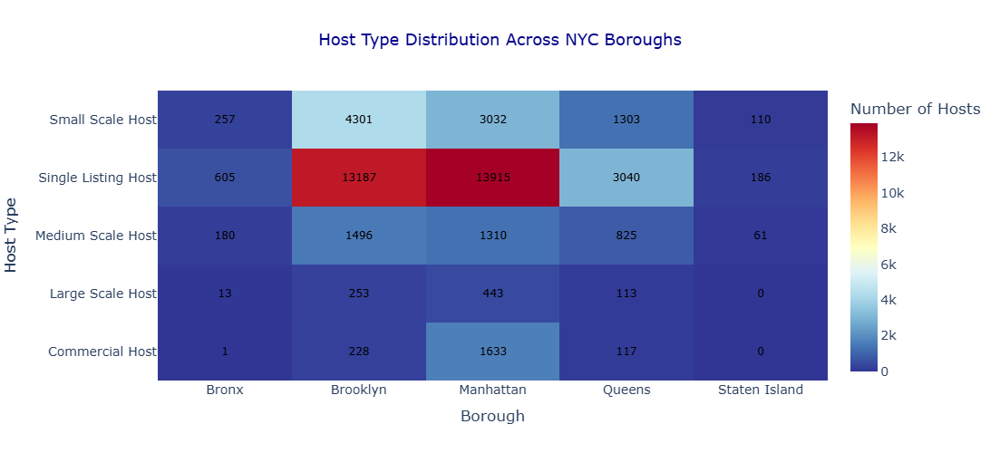

Host Type Distribution by Borough:
neighbourhood_group  Bronx  Brooklyn  Manhattan  Queens  Staten Island
host_type                                                             
Commercial Host          1       228       1633     117              0
Large Scale Host        13       253        443     113              0
Medium Scale Host      180      1496       1310     825             61
Single Listing Host    605     13187      13915    3040            186
Small Scale Host       257      4301       3032    1303            110

Percentage Distribution by Borough:
neighbourhood_group  Bronx  Brooklyn  Manhattan  Queens  Staten Island
host_type                                                             
Commercial Host        0.1       1.2        8.0     2.2            0.0
Large Scale Host       1.2       1.3        2.2     2.1            0.0
Medium Scale Host     17.0       7.7        6.4    15.3           17.1
Single Listing Host   57.3      67.7       68.4    56.3           52.1
Small

In [28]:
# HOST TYPE DISTRIBUTION BY BOROUGH - Heatmap

host_borough = pd.crosstab(data['host_type'], data['neighbourhood_group'])

fig_heatmap = go.Figure(data=go.Heatmap(
    z=host_borough.values,
    x=host_borough.columns,
    y=host_borough.index,
    colorscale='RdYlBu_r',
    text=host_borough.values,
    texttemplate="%{text}",
    textfont={"size": 12, "color": "black"},
    hovertemplate='<b>%{y}</b> in <b>%{x}</b><br>Count: %{z}<extra></extra>',
    colorbar=dict(title="Number of Hosts")
))

fig_heatmap.update_layout(
    title={
        'text': "Host Type Distribution Across NYC Boroughs",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    xaxis_title="Borough",
    yaxis_title="Host Type",
    font=dict(size=14),
    height=500
)
fig_heatmap.show()

print("Host Type Distribution by Borough:")
print(host_borough)
print("\nPercentage Distribution by Borough:")
host_borough_pct = pd.crosstab(data['host_type'], data['neighbourhood_group'], normalize='columns') * 100
print(host_borough_pct.round(1))


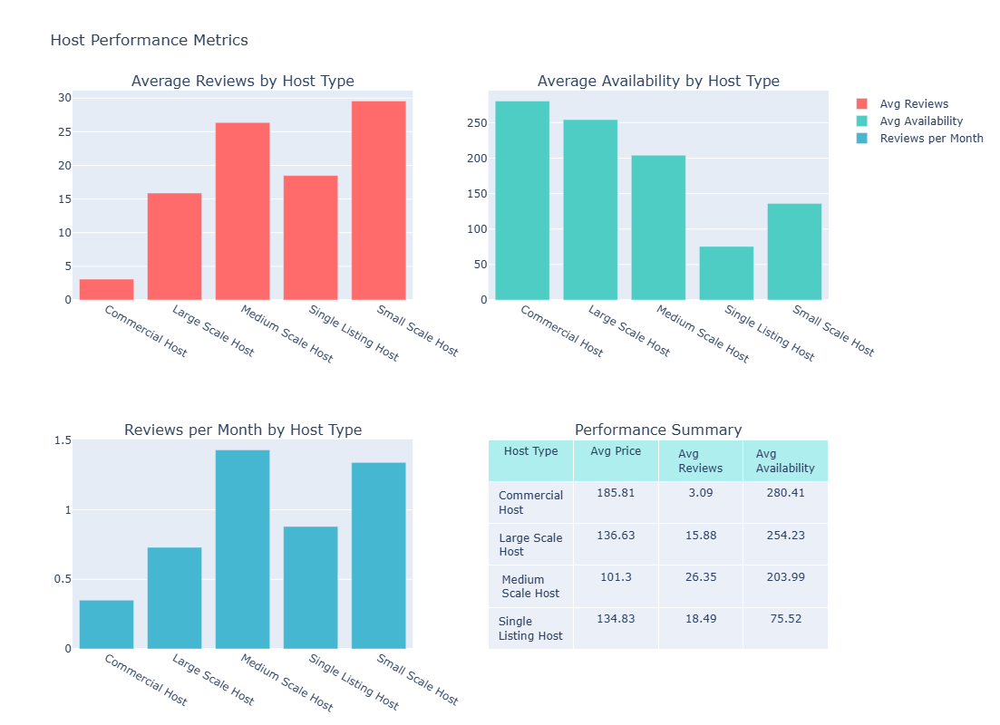

In [29]:
#  HOST PERFORMANCE METRICS

host_performance = data.groupby('host_type').agg({
    'price': ['mean', 'median'],
    'number_of_reviews': ['mean', 'median'],
    'availability_365': ['mean', 'median'],
    'reviews_per_month': ['mean', 'median'],
    'id': 'count'
}).round(2)

host_performance.columns = ['Price_Mean', 'Price_Median', 'Reviews_Mean', 'Reviews_Median', 
                           'Availability_Mean', 'Availability_Median', 'RPM_Mean', 'RPM_Median', 'Count']
host_perf_reset = host_performance.reset_index()
fig_metrics = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Average Reviews by Host Type',
                    'Average Availability by Host Type',
                    'Reviews per Month by Host Type',
                    'Performance Summary'),
    specs=[[{"secondary_y": False}, {"secondary_y": False}],
           [{"secondary_y": False}, {"type": "domain"}]]
)


fig_metrics.add_trace(
    go.Bar(x=host_perf_reset['host_type'], y=host_perf_reset['Reviews_Mean'], 
           name='Avg Reviews', marker_color='#FF6B6B'),
    row=1, col=1
)


fig_metrics.add_trace(
    go.Bar(x=host_perf_reset['host_type'], y=host_perf_reset['Availability_Mean'], 
           name='Avg Availability', marker_color='#4ECDC4'),
    row=1, col=2
)


fig_metrics.add_trace(
    go.Bar(x=host_perf_reset['host_type'], y=host_perf_reset['RPM_Mean'], 
           name='Reviews per Month', marker_color='#45B7D1'),
    row=2, col=1
)


fig_metrics.add_trace(
    go.Table(
        header=dict(values=['Host Type', 'Avg Price', 'Avg Reviews', 'Avg Availability'],
                    fill_color='paleturquoise', align='center'),
        cells=dict(values=[
            host_perf_reset['host_type'],
            host_perf_reset['Price_Mean'],
            host_perf_reset['Reviews_Mean'],
            host_perf_reset['Availability_Mean']
        ])
    ),
    row=2, col=2
)

fig_metrics.update_layout(height=800, width=1000, title_text="Host Performance Metrics")
fig_metrics.show()

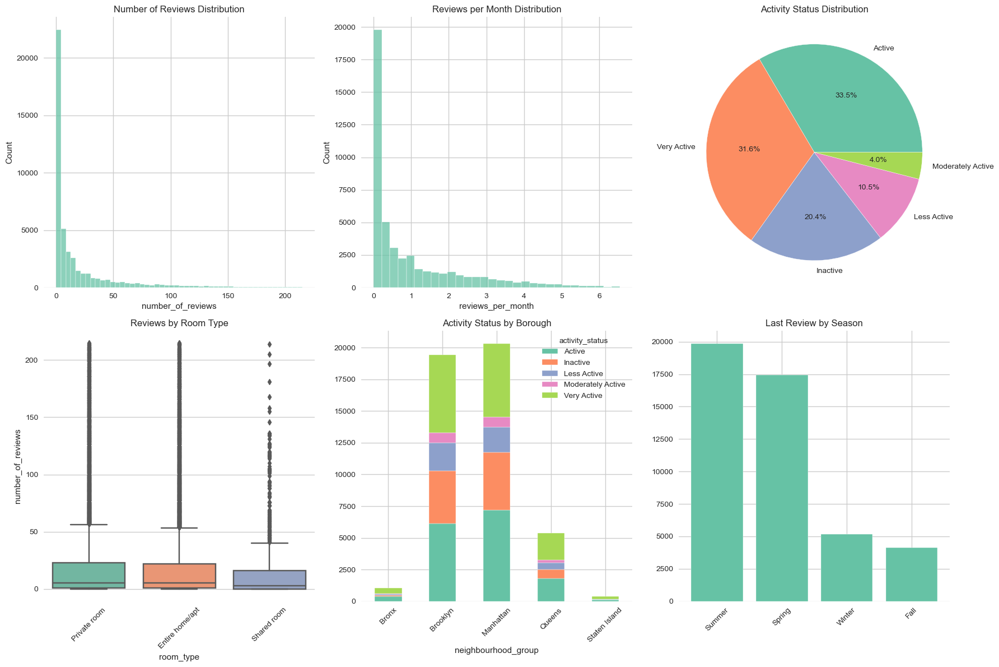


Activity Status Analysis:
                    price        number_of_reviews availability_365
                     mean median              mean             mean
activity_status                                                    
Active             135.25  106.0              8.93           118.49
Inactive           121.95  100.0              7.60            39.50
Less Active        127.51  100.0             12.43            89.39
Moderately Active  115.79   98.0             15.46           109.85
Very Active        131.40  106.0             44.64           152.43


In [30]:
#  REVIEWS AND ACTIVITY ANALYSIS

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Reviews distribution
sns.histplot(data=data, x='number_of_reviews', bins=50, ax=axes[0,0])
axes[0,0].set_title('Number of Reviews Distribution')

# Reviews per month
sns.histplot(data=data[data['reviews_per_month'].notna()], x='reviews_per_month', 
             bins=30, ax=axes[0,1])
axes[0,1].set_title('Reviews per Month Distribution')

# Activity status
activity_counts = data['activity_status'].value_counts()
axes[0,2].pie(activity_counts.values, labels=activity_counts.index, autopct='%1.1f%%')
axes[0,2].set_title('Activity Status Distribution')

# Reviews by room type
sns.boxplot(data=data, x='room_type', y='number_of_reviews', ax=axes[1,0])
axes[1,0].set_title('Reviews by Room Type')
axes[1,0].tick_params(axis='x', rotation=45)

# Activity status by borough
pd.crosstab(data['neighbourhood_group'], data['activity_status']).plot(
    kind='bar', stacked=True, ax=axes[1,1])
axes[1,1].set_title('Activity Status by Borough')
axes[1,1].tick_params(axis='x', rotation=45)

# Seasonal analysis
if 'last_review_season' in data.columns:
    season_counts = data['last_review_season'].value_counts()
    axes[1,2].bar(season_counts.index, season_counts.values)
    axes[1,2].set_title('Last Review by Season')
    axes[1,2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Activity status statistics
print("\nActivity Status Analysis:")
activity_stats = data.groupby('activity_status').agg({
    'price': ['mean', 'median'],
    'number_of_reviews': 'mean',
    'availability_365': 'mean'
}).round(2)
print(activity_stats)


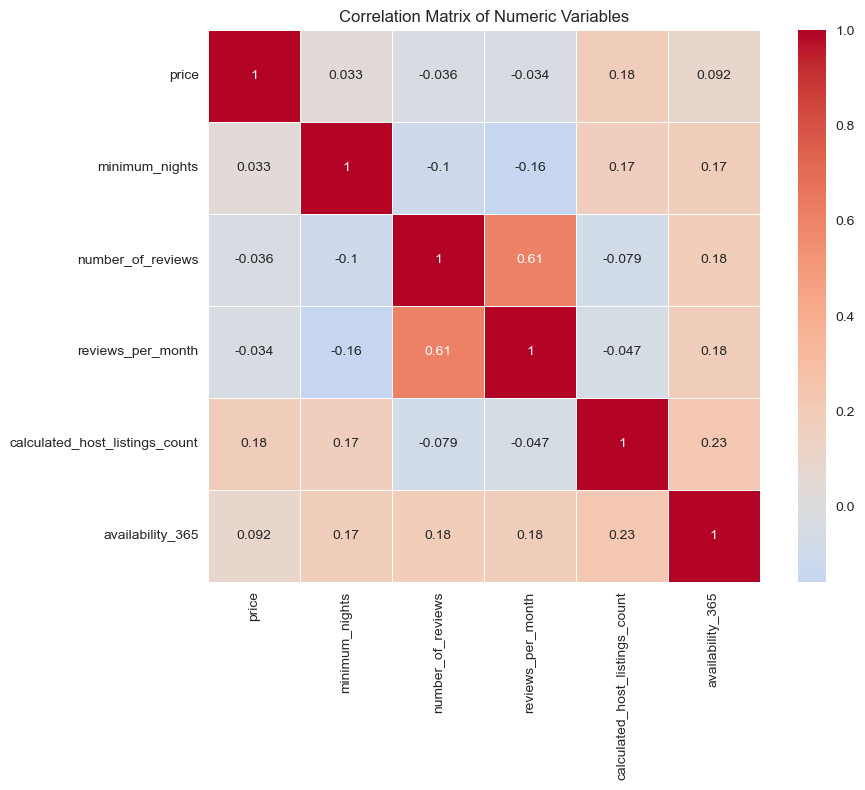

In [31]:
# CORRELATION ANALYSIS

numeric_cols = ['price', 'minimum_nights', 'number_of_reviews', 
                'reviews_per_month', 'calculated_host_listings_count', 
                'availability_365']

correlation_matrix = data[numeric_cols].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Correlation Matrix of Numeric Variables')
plt.tight_layout()
plt.show()

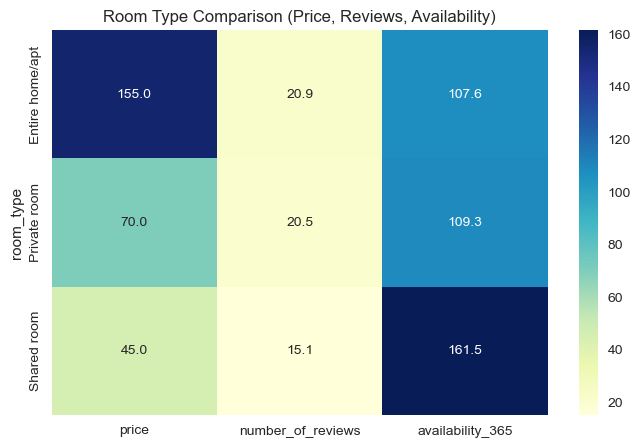

In [53]:
#Room Type vs Price & Reviews
room_stats = data.groupby('room_type').agg({
    'price': 'median',
    'number_of_reviews': 'mean',
    'availability_365': 'mean'
}).round(2)
plt.figure(figsize=(8,5))
sns.heatmap(room_stats, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Room Type Comparison (Price, Reviews, Availability)")
plt.show()

Correlation between Distance and Price: -0.301

Price Statistics by Distance Category:
                    count    mean  median     std
distance_category                                
Close (5-10km)      20973  121.61   100.0   80.72
Far (15-25km)        3339   89.85    70.0   64.01
Moderate (10-15km)   7566  100.68    80.0   64.98
Very Close (≤5km)   14714  165.26   150.0   87.84
Very Far (>25km)       17  161.94   118.0  108.12


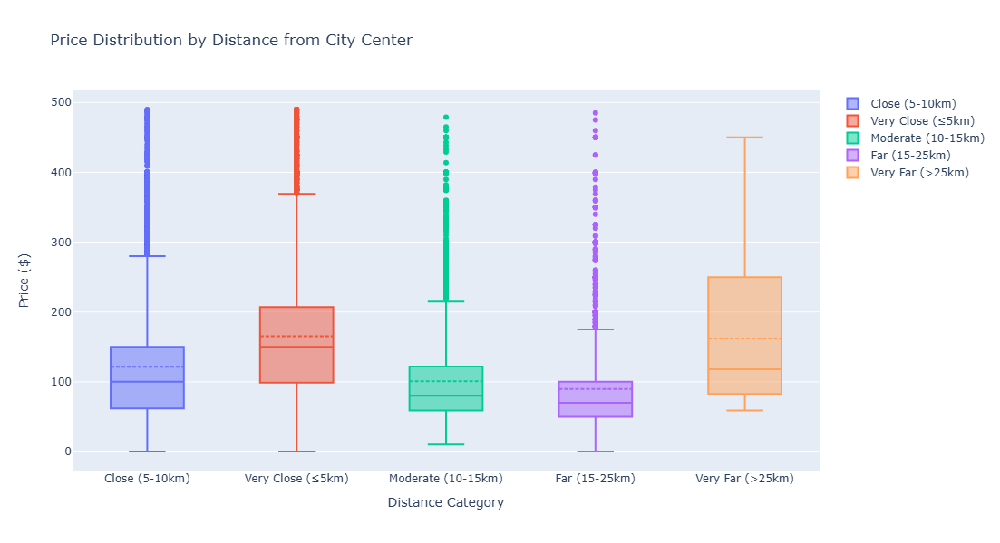

In [55]:

correlation = data['distance'].corr(data['price'])
print(f"Correlation between Distance and Price: {correlation:.3f}")
price_by_distance = data.groupby('distance_category')['price'].agg([
    'count', 'mean', 'median', 'std'
]).round(2)
print("\nPrice Statistics by Distance Category:")
print(price_by_distance)

fig_price_dist = go.Figure()

for cat in distance_cats.index:
    cat_data = data[data['distance_category'] == cat]
    fig_price_dist.add_trace(
        go.Box(y=cat_data['price'], name=cat, boxmean=True)
    )

fig_price_dist.update_layout(
    title="Price Distribution by Distance from City Center",
    xaxis_title="Distance Category",
    yaxis_title="Price ($)",
    height=600
)
fig_price_dist.show()


Reviews and Activity by Distance Category:
                   number_of_reviews        reviews_per_month         \
                                mean median              mean median   
distance_category                                                      
Close (5-10km)                 20.28    5.0              0.97   0.32   
Far (15-25km)                  22.52    8.0              1.33   0.79   
Moderate (10-15km)             23.95    7.0              1.17   0.57   
Very Close (≤5km)              18.84    4.0              0.84   0.27   
Very Far (>25km)               13.94    8.0              1.09   0.82   

                   availability_365         
                               mean median  
distance_category                           
Close (5-10km)               108.95   37.0  
Far (15-25km)                153.92  123.0  
Moderate (10-15km)           122.13   70.0  
Very Close (≤5km)             94.33   13.0  
Very Far (>25km)             175.71  159.0  


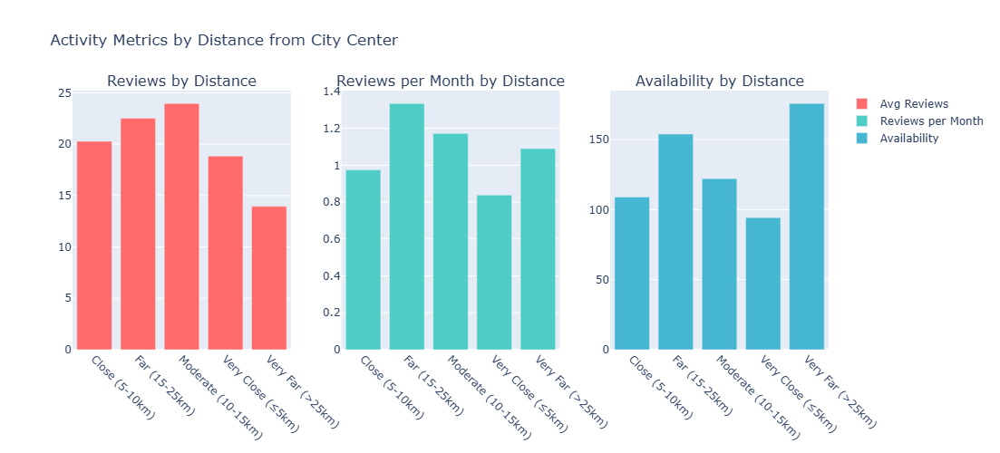

In [57]:

reviews_by_distance = data.groupby('distance_category').agg({
    'number_of_reviews': ['mean', 'median'],
    'reviews_per_month': ['mean', 'median'],
    'availability_365': ['mean', 'median']
}).round(2)

print("Reviews and Activity by Distance Category:")
print(reviews_by_distance)

fig_activity = make_subplots(
    rows=1, cols=3,
    subplot_titles=('Reviews by Distance', 'Reviews per Month by Distance', 
                   'Availability by Distance')
)


avg_reviews = data.groupby('distance_category')['number_of_reviews'].mean()
fig_activity.add_trace(
    go.Bar(x=avg_reviews.index, y=avg_reviews.values, 
           marker_color='#FF6B6B', name='Avg Reviews'),
    row=1, col=1
)

avg_rpm = data.groupby('distance_category')['reviews_per_month'].mean()
fig_activity.add_trace(
    go.Bar(x=avg_rpm.index, y=avg_rpm.values, 
           marker_color='#4ECDC4', name='Reviews per Month'),
    row=1, col=2
)
avg_avail = data.groupby('distance_category')['availability_365'].mean()
fig_activity.add_trace(
    go.Bar(x=avg_avail.index, y=avg_avail.values, 
           marker_color='#45B7D1', name='Availability'),
    row=1, col=3
)
fig_activity.update_layout(height=500, title_text="Activity Metrics by Distance from City Center")
fig_activity.update_xaxes(tickangle=45)
fig_activity.show()

In [59]:
room_distance = pd.crosstab(data['room_type'], data['distance_category'])
print("Room Type Distribution by Distance Category:")
print(room_distance)
borough_distance = data.groupby('neighbourhood_group')['distance'].agg([
    'mean', 'median', 'min', 'max'
]).round(2)
print("\nDistance Statistics by Borough:")
print(borough_distance)


Room Type Distribution by Distance Category:
distance_category  Close (5-10km)  Far (15-25km)  Moderate (10-15km)  \
room_type                                                              
Entire home/apt             10339           1210                2934   
Private room                10107           2017                4353   
Shared room                   527            112                 279   

distance_category  Very Close (≤5km)  Very Far (>25km)  
room_type                                               
Entire home/apt                 9374                12  
Private room                    5126                 5  
Shared room                      214                 0  

Distance Statistics by Borough:
                      mean  median    min    max
neighbourhood_group                             
Bronx                18.35   18.64  12.24  25.32
Brooklyn              6.32    5.88   1.46  16.03
Manhattan             6.63    5.76   0.04  19.97
Queens               12.23   10

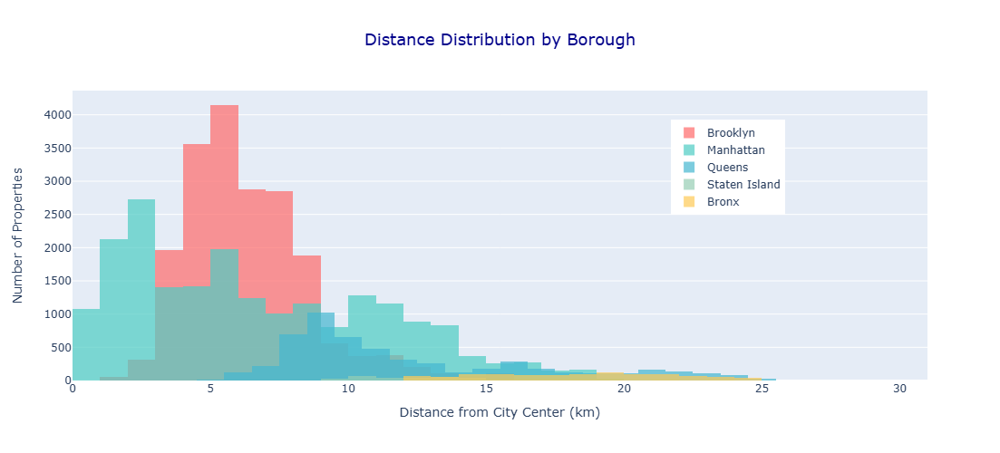

In [61]:
fig_borough_dist = go.Figure()

colors_borough = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FECA57']
for i, borough in enumerate(data['neighbourhood_group'].unique()):
    borough_data = data[data['neighbourhood_group'] == borough]
    fig_borough_dist.add_trace(
        go.Histogram(
            x=borough_data['distance'], 
            name=borough,
            opacity=0.7, 
            nbinsx=25,
            marker_color=colors_borough[i % len(colors_borough)]
        )
    )

fig_borough_dist.update_layout(
    title={
        'text': "Distance Distribution by Borough",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    xaxis_title="Distance from City Center (km)",
    yaxis_title="Number of Properties",
    height=500,
    barmode='overlay',
    legend=dict(x=0.7, y=0.9),
    font=dict(size=12)
)
fig_borough_dist.show()


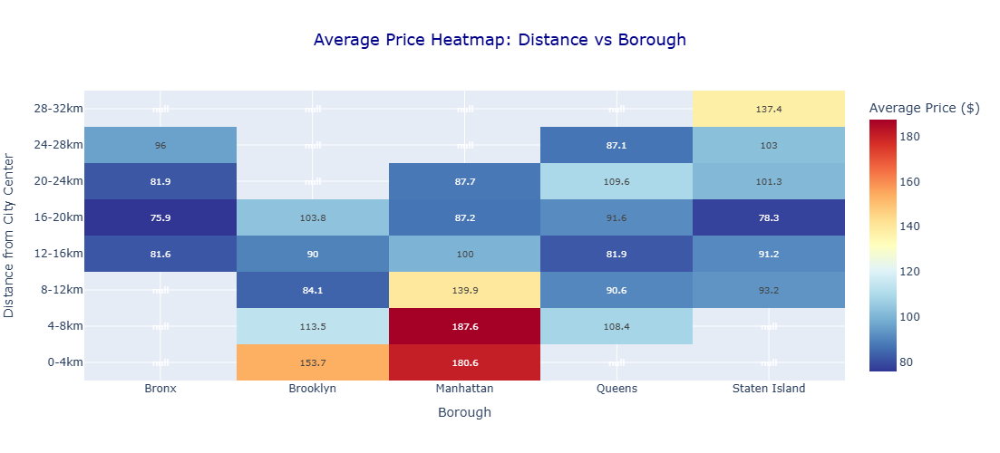

In [67]:
data['distance_bin'] = pd.cut(data['distance'], bins=8, labels=[
    '0-4km', '4-8km', '8-12km', '12-16km', 
    '16-20km', '20-24km', '24-28km', '28-32km'
])

price_distance_heatmap = data.groupby(['distance_bin', 'neighbourhood_group'])['price'].mean().unstack()

fig_heatmap = go.Figure(data=go.Heatmap(
    z=price_distance_heatmap.values,
    x=price_distance_heatmap.columns,
    y=price_distance_heatmap.index,
    colorscale='RdYlBu_r',
    text=np.round(price_distance_heatmap.values, 1),
    texttemplate="%{text}",
    textfont={"size": 10},
    hovertemplate='<b>%{y}</b> in <b>%{x}</b><br>Avg Price: $%{z:.2f}<extra></extra>',
    colorbar=dict(title="Average Price ($)")
))

fig_heatmap.update_layout(
    title={
        'text': "Average Price Heatmap: Distance vs Borough",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    xaxis_title="Borough",
    yaxis_title="Distance from City Center",
    height=500,
    font=dict(size=12)
)
fig_heatmap.show()

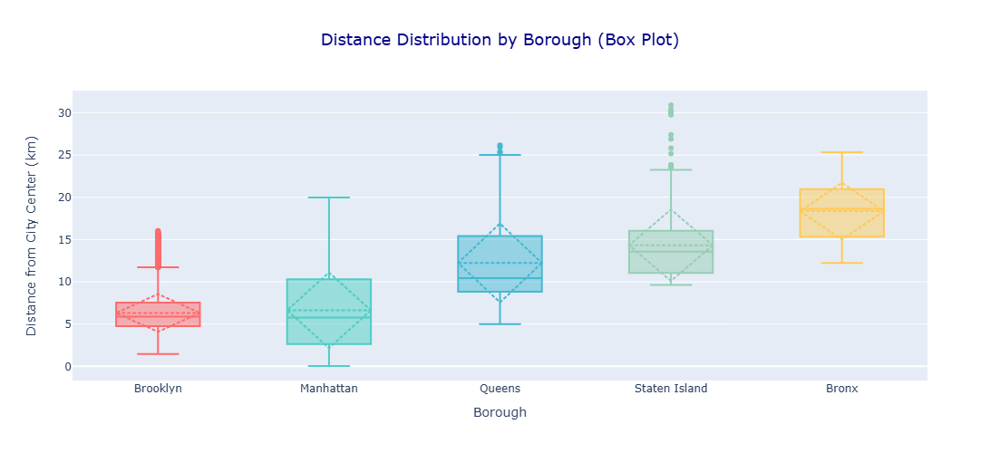

In [65]:
fig_borough_box = go.Figure()

colors_box = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FECA57']
for i, borough in enumerate(data['neighbourhood_group'].unique()):
    borough_data = data[data['neighbourhood_group'] == borough]
    fig_borough_box.add_trace(
        go.Box(
            y=borough_data['distance'],
            name=borough,
            marker_color=colors_box[i % len(colors_box)],
            boxmean='sd' 
        )
    )

fig_borough_box.update_layout(
    title={
        'text': "Distance Distribution by Borough (Box Plot)",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 18, 'color': 'darkblue'}
    },
    xaxis_title="Borough",
    yaxis_title="Distance from City Center (km)",
    height=500,
    showlegend=False,
    font=dict(size=12)
)
fig_borough_box.show()

# 📌 Final Insights

### 🏡 Hosts
- Entire homes are the **most expensive**, but private rooms attract more reviews.  
- Listings with very high availability (>300 days) look like hotels and may face stricter regulations.  

### 👩‍💼 Guests
- Private rooms often give the **best balance of affordability and reliability** (reviews).  
- The **cheapest neighborhoods** may not always have many reviews, so guests should check host ratings carefully.  

### 💰 Investors
- ROI is highest in neighborhoods with **high prices + steady availability** (e.g., Manhattan).  
- Market gaps (few entire homes in high-demand boroughs) = strong investment opportunity.  

### 🏙️ Policymakers
- High % of entire homes in certain boroughs suggests **housing pressure**.  
- Short-term rentals with >300 days/year availability indicate **professional operators**.  

### 📍 Distance Insights
- Proximity to Manhattan significantly impacts prices.  
- **Listings within 5 km of Times Square are the most expensive**, often double or triple the price of outer boroughs.  
- **Brooklyn and Queens** offer cheaper alternatives, but with varying demand.  
- Investors and guests must weigh **price vs. location convenience**.